In [1]:
import scrapy
from scrapy import Selector
import requests
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn.preprocessing as skp
import matplotlib as mpl
import string 
mpl.rcParams['figure.dpi'] = 300

In [2]:
# Create a list with the 30 NBA team names
teams = ['MIL', 'BOS', 'ATL', 'NJN', 'CHI', 'CLE', 'DAL', 'DEN', 'DET', 'GSW', 'NYK', 'OKC', 
         'PHI', 'PHO', 'POR', 'SAC', 'SAS', 'UTA', 'WAS', 'HOU', 'IND', 'LAC', 'LAL', 'MEM', 
         'MIA', 'MIN', 'NOH', 'ORL', 'TOR', 'CHA', ]

# Iterate over the teams list in order to scrape their stats from basketball-reference.com and 
# append them in two tables: table left (tablel) and table right (tabler). The website html
# separates the tabe elements into class="left" and class='right'.

selectors = []
tablel = []
tabler = []

for i in teams:
    url='https://www.basketball-reference.com/teams/'+i+'/stats_per_game_totals.html'
    html = requests.get(url).content
    selectors.append(Selector(text = html))
    tablel.append(selectors[teams.index(i)].xpath('//tbody//tr//*[@class="left "]//text()').extract())
    tabler.append(selectors[teams.index(i)].xpath('//tbody//tr//td[@class="right "]/text()').extract())

In [3]:
# Create a stats categories list by extracting the html table header
cats = selectors[0].xpath('//thead//tr//th//text()').extract()

In [4]:
len(cats)

34

In [5]:
print(cats)

['Season', 'Lg', 'Tm', 'W', 'L', 'Finish', '\xa0', 'Age', 'Ht.', 'Wt.', '\xa0', 'G', 'MP', 'FG', 'FGA', 'FG%', '3P', '3PA', '3P%', '2P', '2PA', '2P%', 'FT', 'FTA', 'FT%', 'ORB', 'DRB', 'TRB', 'AST', 'STL', 'BLK', 'TOV', 'PF', 'PTS']


In [6]:
# Clean up the cats by removing the \xa0

In [7]:
for i in cats:
    if i == '\xa0':
        cats.remove(i)

In [8]:
len(cats)

32

In [9]:
# Cats are clean and tidy, ready to move to the table
print(cats)

['Season', 'Lg', 'Tm', 'W', 'L', 'Finish', 'Age', 'Ht.', 'Wt.', 'G', 'MP', 'FG', 'FGA', 'FG%', '3P', '3PA', '3P%', '2P', '2PA', '2P%', 'FT', 'FTA', 'FT%', 'ORB', 'DRB', 'TRB', 'AST', 'STL', 'BLK', 'TOV', 'PF', 'PTS']


In [10]:
# Clean up the table

In [11]:
# First of all, let's make a function to cut long lists to evenly-sized chunks

# Yield successive n-sized chunks from l. 
def divide_chunks(l, n):
    for i in range(0, len(l), n):  
        yield l[i:i + n] 
        

In [12]:
len(tablel)

30

In [13]:
# The tablel contains triplets of season-NBA-team. I will split them and use them in the future
# to construct 3 dataframe columns. Each team is a list of multiple seasons. I will focus on 
# seasons 1979 - 2019 because the 3 point line was introduced in 1979
print(tablel)

[['2019-20', 'NBA', 'MIL', '2018-19', 'NBA', 'MIL', '2017-18', 'NBA', 'MIL', '2016-17', 'NBA', 'MIL', '2015-16', 'NBA', 'MIL', '2014-15', 'NBA', 'MIL', '2013-14', 'NBA', 'MIL', '2012-13', 'NBA', 'MIL', '2011-12', 'NBA', 'MIL', '2010-11', 'NBA', 'MIL', '2009-10', 'NBA', 'MIL', '2008-09', 'NBA', 'MIL', '2007-08', 'NBA', 'MIL', '2006-07', 'NBA', 'MIL', '2005-06', 'NBA', 'MIL', '2004-05', 'NBA', 'MIL', '2003-04', 'NBA', 'MIL', '2002-03', 'NBA', 'MIL', '2001-02', 'NBA', 'MIL', '2000-01', 'NBA', 'MIL', '1999-00', 'NBA', 'MIL', '1998-99', 'NBA', 'MIL', '1997-98', 'NBA', 'MIL', '1996-97', 'NBA', 'MIL', '1995-96', 'NBA', 'MIL', '1994-95', 'NBA', 'MIL', '1993-94', 'NBA', 'MIL', '1992-93', 'NBA', 'MIL', '1991-92', 'NBA', 'MIL', '1990-91', 'NBA', 'MIL', '1989-90', 'NBA', 'MIL', '1988-89', 'NBA', 'MIL', '1987-88', 'NBA', 'MIL', '1986-87', 'NBA', 'MIL', '1985-86', 'NBA', 'MIL', '1984-85', 'NBA', 'MIL', '1983-84', 'NBA', 'MIL', '1982-83', 'NBA', 'MIL', '1981-82', 'NBA', 'MIL', '1980-81', 'NBA', 'MIL'

In [14]:
# I need to select the 123 first elements of each list (team) in order to have the last 41 seasons 
# (1979-2019). The teams that were founded after 1979 will result in fewer than 41 
# seasons/chunks/dataframe rows
print(tablel[10][:123])

['2019-20', 'NBA', 'NYK', '2018-19', 'NBA', 'NYK', '2017-18', 'NBA', 'NYK', '2016-17', 'NBA', 'NYK', '2015-16', 'NBA', 'NYK', '2014-15', 'NBA', 'NYK', '2013-14', 'NBA', 'NYK', '2012-13', 'NBA', 'NYK', '2011-12', 'NBA', 'NYK', '2010-11', 'NBA', 'NYK', '2009-10', 'NBA', 'NYK', '2008-09', 'NBA', 'NYK', '2007-08', 'NBA', 'NYK', '2006-07', 'NBA', 'NYK', '2005-06', 'NBA', 'NYK', '2004-05', 'NBA', 'NYK', '2003-04', 'NBA', 'NYK', '2002-03', 'NBA', 'NYK', '2001-02', 'NBA', 'NYK', '2000-01', 'NBA', 'NYK', '1999-00', 'NBA', 'NYK', '1998-99', 'NBA', 'NYK', '1997-98', 'NBA', 'NYK', '1996-97', 'NBA', 'NYK', '1995-96', 'NBA', 'NYK', '1994-95', 'NBA', 'NYK', '1993-94', 'NBA', 'NYK', '1992-93', 'NBA', 'NYK', '1991-92', 'NBA', 'NYK', '1990-91', 'NBA', 'NYK', '1989-90', 'NBA', 'NYK', '1988-89', 'NBA', 'NYK', '1987-88', 'NBA', 'NYK', '1986-87', 'NBA', 'NYK', '1985-86', 'NBA', 'NYK', '1984-85', 'NBA', 'NYK', '1983-84', 'NBA', 'NYK', '1982-83', 'NBA', 'NYK', '1981-82', 'NBA', 'NYK', '1980-81', 'NBA', 'NYK',

In [15]:
# Let's split the teams into 41 chunks

tablel2 = []

for i in range(len(teams)):
    tablel2.extend(list(divide_chunks(tablel[i][:123], 3)))

In [16]:
print(tablel2)

[['2019-20', 'NBA', 'MIL'], ['2018-19', 'NBA', 'MIL'], ['2017-18', 'NBA', 'MIL'], ['2016-17', 'NBA', 'MIL'], ['2015-16', 'NBA', 'MIL'], ['2014-15', 'NBA', 'MIL'], ['2013-14', 'NBA', 'MIL'], ['2012-13', 'NBA', 'MIL'], ['2011-12', 'NBA', 'MIL'], ['2010-11', 'NBA', 'MIL'], ['2009-10', 'NBA', 'MIL'], ['2008-09', 'NBA', 'MIL'], ['2007-08', 'NBA', 'MIL'], ['2006-07', 'NBA', 'MIL'], ['2005-06', 'NBA', 'MIL'], ['2004-05', 'NBA', 'MIL'], ['2003-04', 'NBA', 'MIL'], ['2002-03', 'NBA', 'MIL'], ['2001-02', 'NBA', 'MIL'], ['2000-01', 'NBA', 'MIL'], ['1999-00', 'NBA', 'MIL'], ['1998-99', 'NBA', 'MIL'], ['1997-98', 'NBA', 'MIL'], ['1996-97', 'NBA', 'MIL'], ['1995-96', 'NBA', 'MIL'], ['1994-95', 'NBA', 'MIL'], ['1993-94', 'NBA', 'MIL'], ['1992-93', 'NBA', 'MIL'], ['1991-92', 'NBA', 'MIL'], ['1990-91', 'NBA', 'MIL'], ['1989-90', 'NBA', 'MIL'], ['1988-89', 'NBA', 'MIL'], ['1987-88', 'NBA', 'MIL'], ['1986-87', 'NBA', 'MIL'], ['1985-86', 'NBA', 'MIL'], ['1984-85', 'NBA', 'MIL'], ['1983-84', 'NBA', 'MIL'], 

In [17]:
#Perfect! Our left part of the table is ready. We now have independent triplets for each team
# from 1979 until today

In [18]:
# Tabler contains the right part of the html table. It has length = 30, so 30 teams. Each list has
# 29 numbers, so 29 different stats.
len(tabler)

30

In [19]:
print(tabler)

[['53', '12', '1', '29.2', '6-6', '226', '65', '240.8', '43.5', '91.2', '.477', '13.7', '38.6', '.356', '29.8', '52.6', '.567', '17.8', '24.0', '.742', '9.5', '42.2', '51.7', '25.9', '7.4', '6.0', '14.9', '19.2', '118.6', '60', '22', '1', '26.9', '6-7', '227', '82', '241.2', '43.4', '91.1', '.476', '13.5', '38.2', '.353', '29.9', '52.9', '.565', '17.9', '23.2', '.773', '9.3', '40.4', '49.7', '26.0', '7.5', '5.9', '13.9', '19.6', '118.1', '44', '38', '3', '25.9', '6-7', '218', '82', '241.8', '39.7', '83.0', '.478', '8.8', '24.7', '.355', '31.0', '58.3', '.531', '18.3', '23.4', '.783', '8.4', '31.5', '39.8', '23.2', '8.8', '5.4', '13.8', '21.4', '106.5', '42', '40', '2', '25.6', '6-7', '223', '82', '241.2', '38.8', '81.9', '.474', '8.8', '23.7', '.370', '30.0', '58.2', '.516', '17.2', '22.4', '.768', '8.8', '31.6', '40.4', '24.2', '8.1', '5.3', '14.0', '20.2', '103.6', '33', '49', '5', '23.5', '6-8', '228', '82', '241.8', '38.4', '82.2', '.467', '5.4', '15.6', '.345', '33.0', '66.6', '.4

In [20]:
len(tabler[0])

1450

In [21]:
# Let's split the tabler into 41 chunks/seasons of 29 stats for each of the 30 teams (at least 
# for the teams that were founded before 1979)
tabler2 = []

for i in range(len(teams)):
    tabler2.extend(list(divide_chunks(tabler[i][:1189], 29)))

In [22]:
print(tabler2)

[['53', '12', '1', '29.2', '6-6', '226', '65', '240.8', '43.5', '91.2', '.477', '13.7', '38.6', '.356', '29.8', '52.6', '.567', '17.8', '24.0', '.742', '9.5', '42.2', '51.7', '25.9', '7.4', '6.0', '14.9', '19.2', '118.6'], ['60', '22', '1', '26.9', '6-7', '227', '82', '241.2', '43.4', '91.1', '.476', '13.5', '38.2', '.353', '29.9', '52.9', '.565', '17.9', '23.2', '.773', '9.3', '40.4', '49.7', '26.0', '7.5', '5.9', '13.9', '19.6', '118.1'], ['44', '38', '3', '25.9', '6-7', '218', '82', '241.8', '39.7', '83.0', '.478', '8.8', '24.7', '.355', '31.0', '58.3', '.531', '18.3', '23.4', '.783', '8.4', '31.5', '39.8', '23.2', '8.8', '5.4', '13.8', '21.4', '106.5'], ['42', '40', '2', '25.6', '6-7', '223', '82', '241.2', '38.8', '81.9', '.474', '8.8', '23.7', '.370', '30.0', '58.2', '.516', '17.2', '22.4', '.768', '8.8', '31.6', '40.4', '24.2', '8.1', '5.3', '14.0', '20.2', '103.6'], ['33', '49', '5', '23.5', '6-8', '228', '82', '241.8', '38.4', '82.2', '.467', '5.4', '15.6', '.345', '33.0', '66

In [26]:
#Let's combine everything into a nice df!!!

# Make 2 dataframes from th 2 lists of lists and concatenate them
df = pd.concat([pd.DataFrame(tablel2), pd.DataFrame(tabler2)], axis=1)
# Set cats as df column header
df.columns = cats
# Create a new column by combining season and team initials
df["Team"] = df["Season"] + " " + df["Tm"]
# Set the new column as index
df.index = df["Team"]
# Drop the League (NBA) column
df = df.drop(["Lg"], axis=1)
# Drop the team (old) column
df = df.drop(["Team"], axis=1)
# Drop the FG, FT, 2P and 3P columns. I will only keep the attempts and percentages of each shot.
df = df.drop(["FG", "FT", "2P", "3P"], axis=1)


In [27]:
df.head()

,Season,Tm,W,L,Finish,Age,Ht.,Wt.,G,MP,...,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
Team,,,,,,,,,,,,,,,,,,,,,
2019-20 MIL,2019-20,MIL,53,12,1,29.2,6-6,226,65,240.8,...,.742,9.5,42.2,51.7,25.9,7.4,6.0,14.9,19.2,118.6
2018-19 MIL,2018-19,MIL,60,22,1,26.9,6-7,227,82,241.2,...,.773,9.3,40.4,49.7,26.0,7.5,5.9,13.9,19.6,118.1
2017-18 MIL,2017-18,MIL,44,38,3,25.9,6-7,218,82,241.8,...,.783,8.4,31.5,39.8,23.2,8.8,5.4,13.8,21.4,106.5
2016-17 MIL,2016-17,MIL,42,40,2,25.6,6-7,223,82,241.2,...,.768,8.8,31.6,40.4,24.2,8.1,5.3,14.0,20.2,103.6
2015-16 MIL,2015-16,MIL,33,49,5,23.5,6-8,228,82,241.8,...,.747,10.5,31.2,41.7,23.1,8.2,5.8,15.2,20.7,99.0


In [28]:
df.columns

Index(['Season', 'Tm', 'W', 'L', 'Finish', 'Age', 'Ht.', 'Wt.', 'G', 'MP',
       'FGA', 'FG%', '3PA', '3P%', '2PA', '2P%', 'FTA', 'FT%', 'ORB', 'DRB',
       'TRB', 'AST', 'STL', 'BLK', 'TOV', 'PF', 'PTS'],
      dtype='object')

In [29]:
# Make a loop to add a 'decade' column: If the first 3 digits of th index value are '201_' then
# add decade = 10s etc.
decade_list=[]

for i in df['Season']:
    if i[:3] == '201':
        decade_list.append('10s') 
    elif i[:3]  == '200':
        decade_list.append('00s')
    elif i[:3] == '199':
        decade_list.append('90s')
    else:
        decade_list.append('80s')

df['Decade'] = decade_list

In [30]:
# Convert player height to cm
height_list=[]

for i in df['Ht.']:
    height_list.append(np.sum([int(i.split('-')[0])*30.48, int(i.split('-')[1])*2.54]))

df['Height'] = height_list

In [31]:
season_list = []
for i in df['Season']:
    season_list.append(i[:4])
    
df['Season']= season_list

In [32]:
# Drop height in feet and season position
df = df.drop(["Ht."], axis=1)
df = df.drop(['Finish'], axis=1)

In [35]:
# Reorder the columns so that decade is close to the beginning of the df
df = df[['Tm', 'Decade', 'Season', 'W', 'L', 'Age', 'Height', 'Wt.', 'G', 'MP', 'FGA',
       'FG%', '3PA', '3P%', '2PA', '2P%', 'FTA', 'FT%', 'ORB', 'DRB', 'TRB', 'AST', 'STL', 
         'BLK', 'TOV', 'PF', 'PTS']]

In [36]:
#PERFECT!!!
df.head()

,Tm,Decade,Season,W,L,Age,Height,Wt.,G,MP,...,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
Team,,,,,,,,,,,,,,,,,,,,,
2019-20 MIL,MIL,10s,2019,53,12,29.2,198.12,226,65,240.8,...,.742,9.5,42.2,51.7,25.9,7.4,6.0,14.9,19.2,118.6
2018-19 MIL,MIL,10s,2018,60,22,26.9,200.66,227,82,241.2,...,.773,9.3,40.4,49.7,26.0,7.5,5.9,13.9,19.6,118.1
2017-18 MIL,MIL,10s,2017,44,38,25.9,200.66,218,82,241.8,...,.783,8.4,31.5,39.8,23.2,8.8,5.4,13.8,21.4,106.5
2016-17 MIL,MIL,10s,2016,42,40,25.6,200.66,223,82,241.2,...,.768,8.8,31.6,40.4,24.2,8.1,5.3,14.0,20.2,103.6
2015-16 MIL,MIL,10s,2015,33,49,23.5,203.20,228,82,241.8,...,.747,10.5,31.2,41.7,23.1,8.2,5.8,15.2,20.7,99.0


In [37]:
df.describe()

,Height
count,1134.000000
mean,199.110018
std,1.610899
min,193.040000
25%,198.120000
50%,198.120000
75%,200.660000
max,203.200000


In [38]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1134 entries, 2019-20 MIL to 1988-89 CHH
Data columns (total 27 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Tm      1134 non-null   object 
 1   Decade  1134 non-null   object 
 2   Season  1134 non-null   object 
 3   W       1134 non-null   object 
 4   L       1134 non-null   object 
 5   Age     1134 non-null   object 
 6   Height  1134 non-null   float64
 7   Wt.     1134 non-null   object 
 8   G       1134 non-null   object 
 9   MP      1134 non-null   object 
 10  FGA     1134 non-null   object 
 11  FG%     1134 non-null   object 
 12  3PA     1134 non-null   object 
 13  3P%     1134 non-null   object 
 14  2PA     1134 non-null   object 
 15  2P%     1134 non-null   object 
 16  FTA     1134 non-null   object 
 17  FT%     1134 non-null   object 
 18  ORB     1134 non-null   object 
 19  DRB     1134 non-null   object 
 20  TRB     1134 non-null   object 
 21  AST     1134 non-null   o

In [39]:
# Convert df to numeric
df_num = df.iloc[:, 2:].apply(pd.to_numeric)

In [40]:
df_num.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1134 entries, 2019-20 MIL to 1988-89 CHH
Data columns (total 25 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Season  1134 non-null   int64  
 1   W       1134 non-null   int64  
 2   L       1134 non-null   int64  
 3   Age     1134 non-null   float64
 4   Height  1134 non-null   float64
 5   Wt.     1134 non-null   int64  
 6   G       1134 non-null   int64  
 7   MP      1134 non-null   float64
 8   FGA     1134 non-null   float64
 9   FG%     1134 non-null   float64
 10  3PA     1134 non-null   float64
 11  3P%     1134 non-null   float64
 12  2PA     1134 non-null   float64
 13  2P%     1134 non-null   float64
 14  FTA     1134 non-null   float64
 15  FT%     1134 non-null   float64
 16  ORB     1134 non-null   float64
 17  DRB     1134 non-null   float64
 18  TRB     1134 non-null   float64
 19  AST     1134 non-null   float64
 20  STL     1134 non-null   float64
 21  BLK     1134 non-null   f

In [42]:
# I will only keep the stats from FGA and on for clustering:
# Field Goals, Field Coal Attempts, Field Goal %, 3 Pointers, 3 Point Attempts, 3 Point %,
# 2 Pointers, 2 point Attempts, 2 point %, Free Throws, Free Throw Attempts, Free Throw %,
# Offensice Rebounds, Defensive Rebounds, Total Rebounds, Assists, Steals, Blocks, Turnovers, 
# Personal Fouls, points
df_num.columns[8:]

Index(['FGA', 'FG%', '3PA', '3P%', '2PA', '2P%', 'FTA', 'FT%', 'ORB', 'DRB',
       'TRB', 'AST', 'STL', 'BLK', 'TOV', 'PF', 'PTS'],
      dtype='object')

In [43]:
# Create a second dataframe with the "clustering" stats
df2 = df_num.iloc[:, 8:]

### Now I have all the stats from 1979 on. It's time to compare the teams based on their stats

# Histograms

/home/nomikos/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


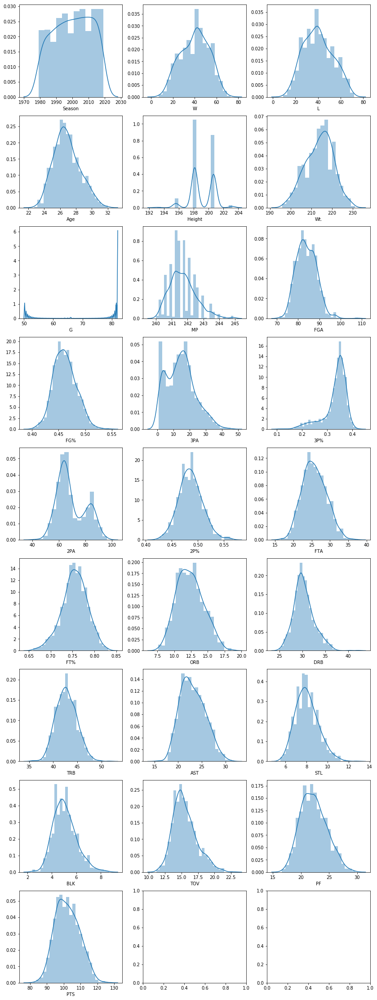

In [44]:
# Check the distribution of all variables in the numerical Dataframe (df_num)

fig, axes = plt.subplots(ncols=3, nrows=9, figsize=(14, 40))
for i, ax in zip(df_num.columns, axes.flat):
    sns.distplot(df_num[i], hist=True, ax=ax)
plt.show()

# Boxplots

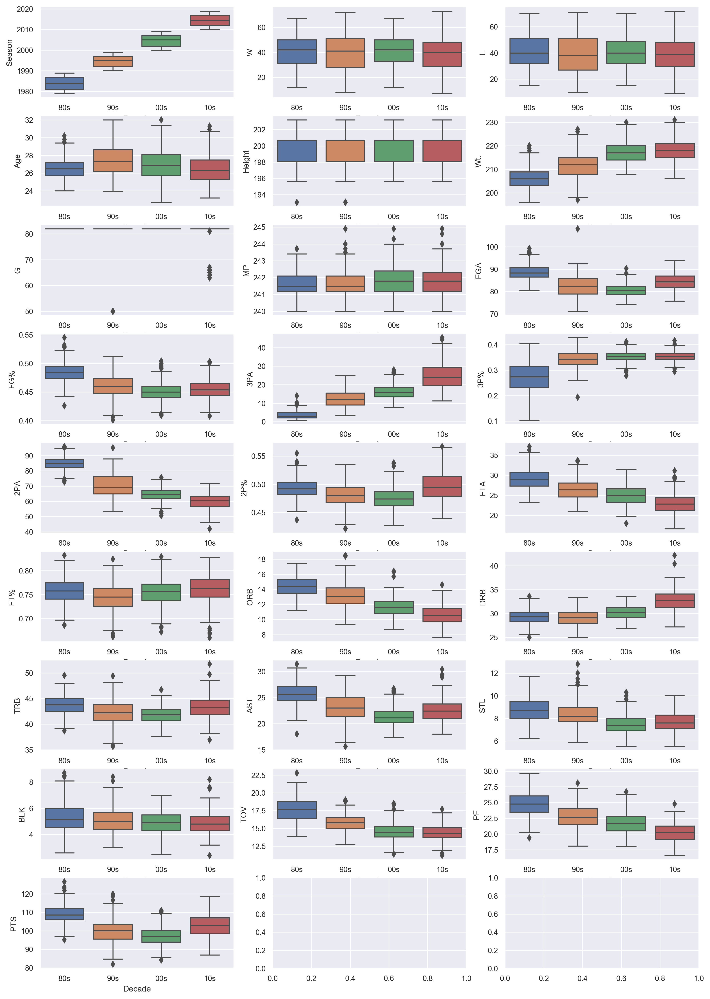

In [63]:
# Check the boxplot of the variables, grouped by decade
sns.set_context('paper')

fig, axes = plt.subplots(ncols=3, nrows=9, figsize=(14, 21))
for i, ax in zip(df_num.columns, axes.flat):
    sns.boxplot(df['Decade'], df_num[i], order=['80s', '90s', '00s', '10s'],
               hue_order=['80s', '90s', '00s', '10s'], ax=ax)
plt.show()

In [76]:
# Define an IQR function
def iqr(x):
    return(np.subtract(*np.percentile(x, [75, 25])))

In [96]:
# Find the teams of the specific decade that have a value higher than 1.5 times the
# IQR plus the 75th percentile.
# i.e Find the outliers!!!
for i in df['Decade'].unique():
    for j in df_num.columns:
        print(str(i) + ", " + str(j) + ", " + str(df_num[df['Decade']==i][df_num[j] > 
                                  (1.5*iqr(df_num[j][df['Decade']==i]) + 
                                   np.percentile(df_num[j][df['Decade']==i], 75))].index))

/home/nomikos/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/home/nomikos/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/home/nomikos/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/home/nomikos/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/home/nomikos/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/home/nomikos/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/home/nomikos/anaconda3/lib/python3.7/site-packages/ipykernel_la

10s, Season, Index([], dtype='object', name='Team')
10s, W, Index([], dtype='object', name='Team')
10s, L, Index([], dtype='object', name='Team')
10s, Age, Index(['2011-12 DAL', '2010-11 DAL'], dtype='object', name='Team')
10s, Height, Index([], dtype='object', name='Team')
10s, Wt., Index(['2015-16 CLE'], dtype='object', name='Team')
10s, G, Index([], dtype='object', name='Team')
10s, MP, Index(['2012-13 BOS', '2011-12 ATL', '2010-11 NJN', '2015-16 DAL',
       '2010-11 OKC', '2010-11 PHO', '2011-12 UTA', '2013-14 WAS'],
      dtype='object', name='Team')
10s, FGA, Index([], dtype='object', name='Team')
10s, FG%, Index(['2017-18 GSW', '2013-14 MIA'], dtype='object', name='Team')
10s, 3PA, Index(['2019-20 HOU', '2018-19 HOU'], dtype='object', name='Team')
10s, 3P%, Index(['2015-16 GSW', '2012-13 GSW'], dtype='object', name='Team')
10s, 2PA, Index([], dtype='object', name='Team')
10s, 2P%, Index(['2019-20 MIL'], dtype='object', name='Team')
10s, FTA, Index(['2010-11 DEN', '2010-11 OKC',

/home/nomikos/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/home/nomikos/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/home/nomikos/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/home/nomikos/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/home/nomikos/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/home/nomikos/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/home/nomikos/anaconda3/lib/python3.7/site-packages/ipykernel_la

In [97]:
# Find the teams of the specific decade that have a value lower than 1.5 times the
# IQR plus the 25th percentile.
# i.e Find the outliers!!!
for i in df['Decade'].unique():
    for j in df_num.columns:
        print(str(i) + ", " + str(j) + ", " + str(df_num[df['Decade']==i][df_num[j] < 
                                  (np.percentile(df_num[j][df['Decade']==i], 25) - 
                                   1.5*iqr(df_num[j][df['Decade']==i]))].index))

/home/nomikos/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/home/nomikos/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/home/nomikos/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/home/nomikos/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/home/nomikos/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/home/nomikos/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/home/nomikos/anaconda3/lib/python3.7/site-packages/ipykernel_la

10s, Season, Index([], dtype='object', name='Team')
10s, W, Index([], dtype='object', name='Team')
10s, L, Index([], dtype='object', name='Team')
10s, Age, Index([], dtype='object', name='Team')
10s, Height, Index([], dtype='object', name='Team')
10s, Wt., Index([], dtype='object', name='Team')
10s, G, Index(['2019-20 MIL', '2011-12 MIL', '2019-20 BOS', '2012-13 BOS',
       '2011-12 BOS', '2019-20 ATL', '2011-12 ATL', '2019-20 BRK',
       '2011-12 NJN', '2019-20 CHI', '2011-12 CHI', '2019-20 CLE',
       '2011-12 CLE', '2019-20 DAL', '2011-12 DAL', '2019-20 DEN',
       '2011-12 DEN', '2019-20 DET', '2011-12 DET', '2019-20 GSW',
       '2011-12 GSW', '2019-20 NYK', '2011-12 NYK', '2019-20 OKC',
       '2011-12 OKC', '2019-20 PHI', '2011-12 PHI', '2019-20 PHO',
       '2011-12 PHO', '2019-20 POR', '2011-12 POR', '2019-20 SAC',
       '2011-12 SAC', '2019-20 SAS', '2011-12 SAS', '2019-20 UTA',
       '2011-12 UTA', '2019-20 WAS', '2011-12 WAS', '2019-20 HOU',
       '2011-12 HOU', '201

/home/nomikos/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/home/nomikos/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/home/nomikos/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/home/nomikos/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/home/nomikos/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/home/nomikos/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/home/nomikos/anaconda3/lib/python3.7/site-packages/ipykernel_la

# Correlation heatmap

In [45]:
# Calculate pairwise correlation coefficients
dfcorr = df_num.corr()

In [46]:
# Keep only the strong ones, let's say > 0.6
dfcorr[abs(dfcorr)<0.6] = 0

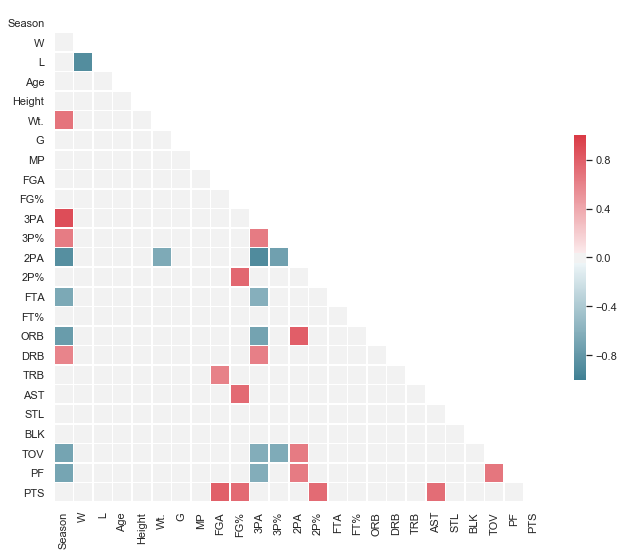

In [48]:
# Make a Seaborn heatmap using the correlation DataFrame we created
sns.set(style="white")
mask = np.triu(np.ones_like(dfcorr, dtype=np.bool))
fig, ax = plt.subplots(figsize=(11, 9))
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(dfcorr, mask=mask, cmap=cmap, vmax=1, vmin=-1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.show()

# Scatterplots

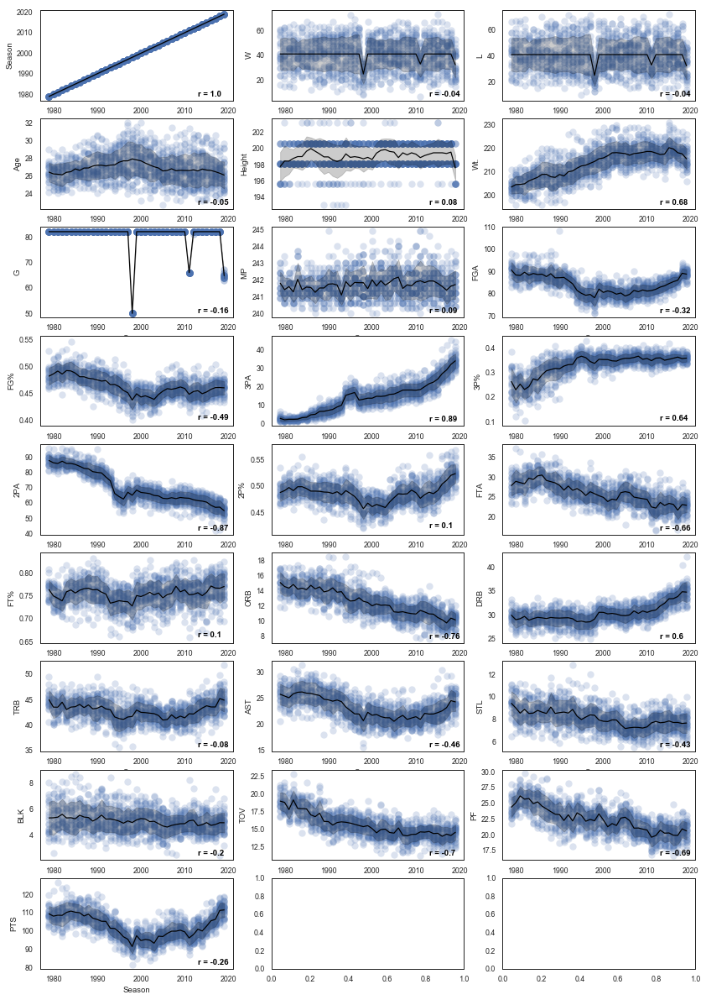

In [50]:
# Make scatterplots for all the variables 
sns.set_context('paper')

fig, axes = plt.subplots(ncols=3, nrows=9, figsize=(14, 21))
for i, ax, y in zip(dfcorr.columns, axes.flat, range(29)):
    p1 = sns.scatterplot(df_num['Season'], df_num[i], alpha=0.2, s =70, ax=ax, linewidth=0)
    sns.lineplot(df_num['Season'], df_num[i], ax=ax, ci='sd', color='black')
    p1.text(2013, df_num[i].min(), "r = " + str(round(np.corrcoef(df_num['Season'], df_num[i])[0, 1], 2)), 
            horizontalalignment='left', size='medium', color='black', weight='semibold')
    #p1.text(1979, df_num[i].min(), string.ascii_lowercase[y], horizontalalignment='right', 
    #        size='large', color='black', weight='semibold')
plt.show()

In [51]:
# Make two lists with the names of point-related stats (prelated) and non point-related (nrelated).
# I will use them in order to create two separate time series plots.
prelated = ['PTS', 'FGA', 'FG%', '2PA', '2P%', '3PA', '3P%', 'FTA', 'FT%']
nrelated = ['Wt.', 'ORB', 'DRB', 'TOV', 'PF']

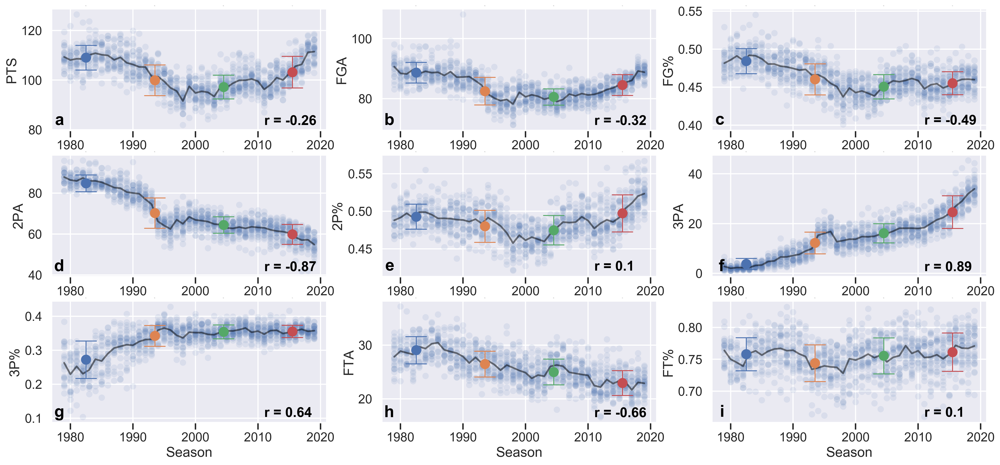

In [53]:
# Make scatterplots for the point-related variables 
sns.set_context('talk')
mpl.rcParams['figure.dpi'] = 300
sns.set_style('darkgrid')

fig, axes = plt.subplots(ncols=3, nrows=3, figsize=(22, 10))
for i, ax, y in zip(prelated, axes.flat, range(len(prelated))):
    ax2 = ax.twiny()
    p1 = sns.scatterplot(df_num['Season'], df_num[i], alpha=0.1, s =70, ax=ax, linewidth=0)
    sns.lineplot(df_num['Season'], df_num[i], ax=ax, ci=None, color='black', alpha = 0.5)
    sns.pointplot(df['Decade'], df_num[i], ci='sd', capsize=0.3, markers='o', scale=1, 
                  errwidth=1.2, hue=df['Decade'], order=['80s', '90s', '00s', '10s'], 
                  hue_order=['80s', '90s', '00s', '10s'], ax=ax2)
    p1.text(2011, df_num[i].min(), "r = " + str(round(np.corrcoef(df_num['Season'], df_num[i])[0, 1], 2)), 
            horizontalalignment='left', size='medium', color='black', weight='semibold')
    p1.text(1979, df_num[i].min(), string.ascii_lowercase[y], horizontalalignment='right', 
            size='large', color='black', weight='semibold')
    ax2.set_xlabel('')
    ax2.tick_params(axis='x', labelsize=0, length=0)
    ax2.get_legend().set_visible(False)

plt.show()

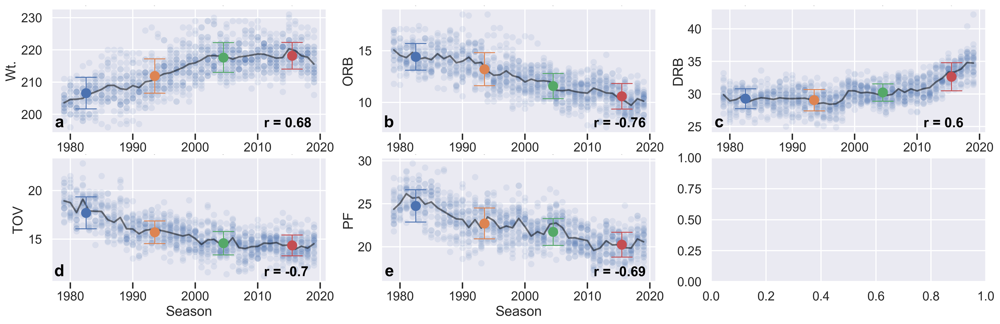

In [54]:
# Make scatterplots for the non -point-related variables 
sns.set_context('talk')
mpl.rcParams['figure.dpi'] = 300
sns.set_style('darkgrid')

fig, axes = plt.subplots(ncols=3, nrows=2, figsize=(22, 6.6))
for i, ax, y in zip(nrelated, axes.flat, range(len(nrelated))):
    ax2 = ax.twiny()
    p1 = sns.scatterplot(df_num['Season'], df_num[i], alpha=0.1, s =70, ax=ax, linewidth=0)
    sns.lineplot(df_num['Season'], df_num[i], ax=ax, ci=None, color='black', alpha=0.5)
    sns.pointplot(df['Decade'], df_num[i], ci='sd',  capsize=0.3, 
                  markers='o', scale=1, errwidth=1.2, hue=df['Decade'],
                  order=['80s', '90s', '00s', '10s'], hue_order=['80s', '90s', '00s', '10s'], 
                  ax=ax2)
    p1.text(2011, df_num[i].min(), "r = " + str(round(np.corrcoef(df_num['Season'], df_num[i])[0, 1], 2)), 
            horizontalalignment='left', size='medium', color='black', weight='semibold')
    p1.text(1979, df_num[i].min(), string.ascii_lowercase[y], horizontalalignment='right', 
            size='large', color='black', weight='semibold')
    ax2.set_xlabel('')
    ax2.tick_params(axis='x', labelsize=0, length=0)
    ax2.get_legend().set_visible(False)

plt.show()

In [119]:
prcorr = df_num[prelated].corr()

In [121]:
# Keep only the strong ones, let's say > 0.6
prcorr[abs(prcorr)<0.6] = 0

In [142]:
prcorr

,PTS,FGA,FG%,2PA,2P%,3PA,3P%,FTA,FT%
PTS,1.000000,0.789652,0.734412,0.000000,0.729346,0.000000,0.000000,0.00000,0.0
FGA,0.789652,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.0
FG%,0.734412,0.000000,1.000000,0.000000,0.757400,0.000000,0.000000,0.00000,0.0
2PA,0.000000,0.000000,0.000000,1.000000,0.000000,-0.902141,-0.731707,0.00000,0.0
2P%,0.729346,0.000000,0.757400,0.000000,1.000000,0.000000,0.000000,0.00000,0.0
3PA,0.000000,0.000000,0.000000,-0.902141,0.000000,1.000000,0.645858,-0.60328,0.0
3P%,0.000000,0.000000,0.000000,-0.731707,0.000000,0.645858,1.000000,0.00000,0.0
FTA,0.000000,0.000000,0.000000,0.000000,0.000000,-0.603280,0.000000,1.00000,0.0
FT%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,1.0


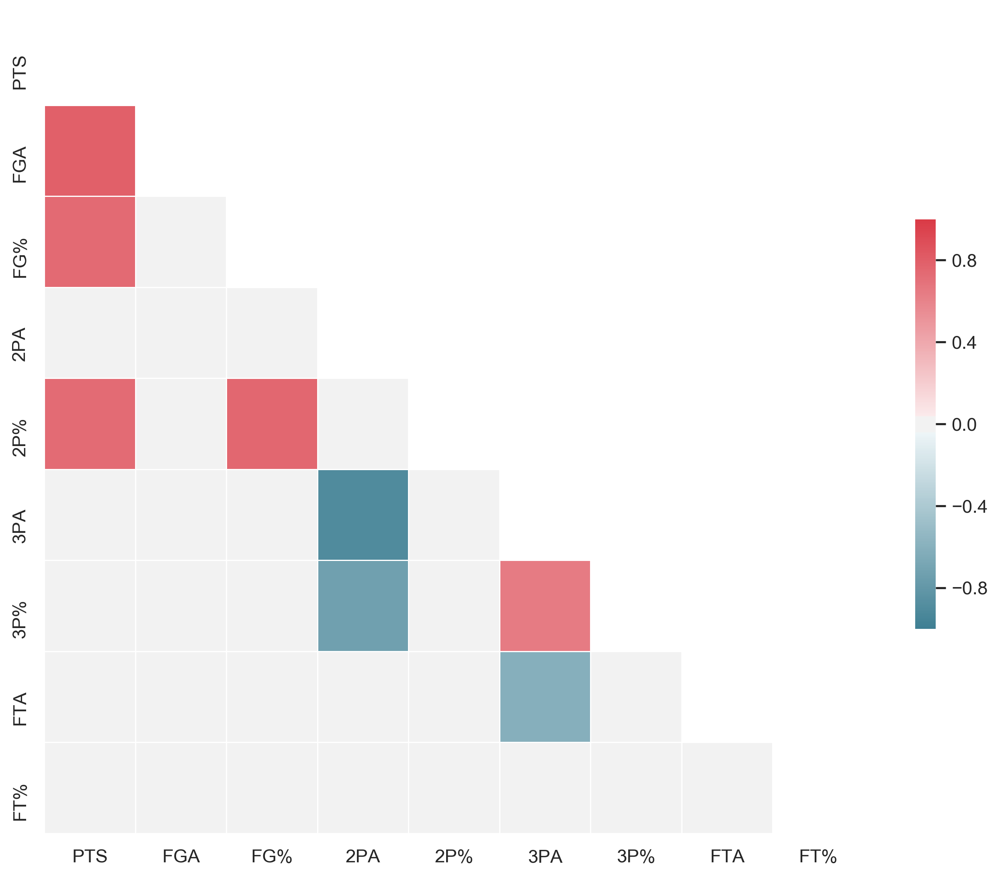

In [122]:
# Make a Seaborn heatmap using the correlation DataFrame we created
sns.set(style="white")
mask = np.triu(np.ones_like(prcorr, dtype=np.bool))
fig, ax = plt.subplots(figsize=(11, 9))
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(prcorr, mask=mask, cmap=cmap, vmax=1, vmin=-1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.show()

In [76]:
dfcorr.columns

Index(['Season', 'W', 'L', 'Age', 'Height', 'Wt.', 'G', 'MP', 'FGA', 'FG%',
       '3PA', '3P%', '2PA', '2P%', 'FTA', 'FT%', 'ORB', 'DRB', 'TRB', 'AST',
       'STL', 'BLK', 'TOV', 'PF', 'PTS'],
      dtype='object')

# Clustermap

In [82]:
# Convert df2 to numeric
df2_num = df2.apply(pd.to_numeric)

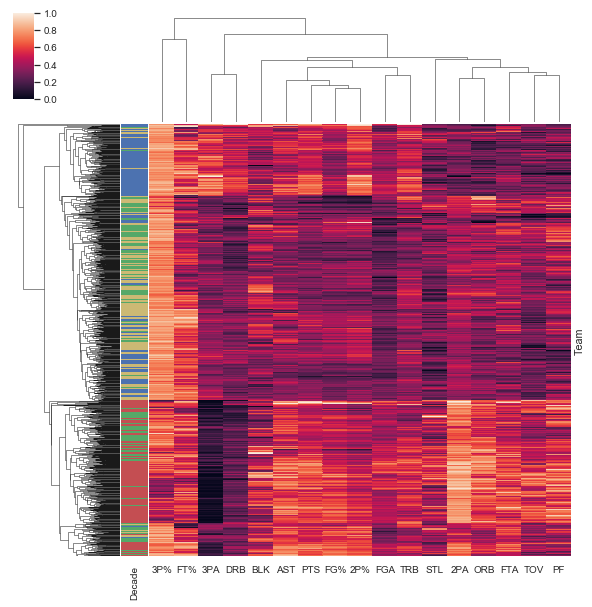

In [83]:
lut1 = dict(zip(df["Decade"].unique(), "bygr"))
row_colors1 = df["Decade"].map(lut1)
sns.set(font_scale = 0.9)

g = sns.clustermap(df2_num, standard_scale = 1, col_cluster = True, 
               row_colors=row_colors1, yticklabels=False, cbar_kws={"orientation": "vertical"})


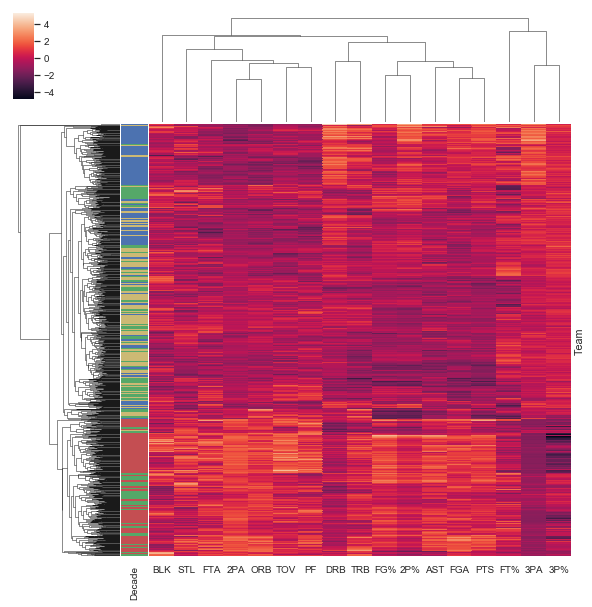

In [84]:
lut1 = dict(zip(df["Decade"].unique(), "bygr"))
row_colors1 = df["Decade"].map(lut1)
sns.set(font_scale = 0.9)

g = sns.clustermap(df2_num, z_score = 1, col_cluster = True, 
               row_colors=row_colors1, yticklabels=False, cbar_kws={"orientation": "vertical"})


# PCA

In [85]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [86]:
x = StandardScaler().fit_transform(df2.values)

In [87]:
# Check the shape of the normalized df
x.shape

(1134, 17)

In [88]:
# Check the scaled df's mean and STD
np.mean(x), np.std(x)

(-5.594998821889366e-16, 1.0)

In [89]:
# Create a new dataframe (ndf2) with the normalized values
ndf2 = pd.DataFrame(x, columns=df2.columns, index=df2.index)
ndf2

,FGA,FG%,3PA,3P%,2PA,2P%,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
Team,,,,,,,,,,,,,,,,,
2019-20 MIL,1.558076,0.709467,2.746017,0.488773,-1.573414,3.539833,-0.537157,-0.435871,-1.448426,5.313524,4.189181,1.072431,-0.599529,0.979539,-0.336989,-1.325963,2.307973
2018-19 MIL,1.536634,0.662355,2.700230,0.425174,-1.545189,3.452320,-0.782146,0.630050,-1.549349,4.504655,3.253724,1.110776,-0.507556,0.874776,-0.886364,-1.153478,2.237701
2017-18 MIL,-0.200205,0.756580,1.154914,0.467573,-1.037136,1.964601,-0.720899,0.973896,-2.003501,0.505246,-1.376788,0.037127,0.688096,0.350964,-0.941301,-0.377293,0.607389
2016-17 MIL,-0.436072,0.568131,1.040446,0.785570,-1.046545,1.308255,-1.027136,0.458127,-1.801656,0.550183,-1.096151,0.420573,0.044283,0.246201,-0.831426,-0.894749,0.199811
2015-16 MIL,-0.371745,0.238345,0.113257,0.255575,-0.256241,0.389370,-0.935265,-0.263949,-0.943813,0.370435,-0.488104,-0.001217,0.136257,0.770014,-0.172176,-0.679143,-0.446692
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1992-93 CHH,0.850475,1.180590,-0.928401,-0.147221,1.136198,0.608152,0.994028,0.561281,0.519565,0.100811,0.540899,1.264154,-0.231636,0.770014,0.377199,-0.204808,1.113348
1991-92 CHH,1.793943,0.709467,-1.157337,-0.338019,1.738334,-0.004437,0.197812,0.011128,0.923255,-0.663121,0.166716,1.839323,1.791775,-1.325236,-0.007364,-0.032322,1.029021
1990-91 CHH,0.400183,0.238345,-1.088656,-0.401618,1.070340,-0.398245,0.381554,0.836358,0.065413,-1.606801,-1.563879,0.573952,1.147963,-1.429999,0.102511,0.614499,0.087375


In [90]:
# Perform PCA on the normalized dataframe, for 2 princial components
pca_df2 = PCA(n_components=2)
principalComponents_df2 = pca_df2.fit_transform(x)

In [91]:
# Checking the PC shape
principalComponents_df2.shape

(1134, 2)

In [92]:
# Let's create a new dataframe with the principal components and back the columns I removed before
# normalizing the data.
principal_df2 = pd.DataFrame(data = principalComponents_df2
             , columns = ['principal component 1', 'principal component 2'], index=df.index)

In [93]:
principal_df2 = pd.concat([principal_df2, df.iloc[:, :10]], axis=1)

In [94]:
principal_df2.head()

,principal component 1,principal component 2,Tm,Decade,Season,W,L,Age,Height,Wt.,G,MP
Team,,,,,,,,,,,,
2019-20 MIL,-0.978597,8.130203,MIL,10s,2019,53,12,29.2,198.12,226,65,240.8
2018-19 MIL,-1.231815,7.721805,MIL,10s,2018,60,22,26.9,200.66,227,82,241.2
2017-18 MIL,-1.695485,2.330341,MIL,10s,2017,44,38,25.9,200.66,218,82,241.8
2016-17 MIL,-2.157165,1.953471,MIL,10s,2016,42,40,25.6,200.66,223,82,241.2
2015-16 MIL,-1.098680,0.435504,MIL,10s,2015,33,49,23.5,203.20,228,82,241.8


In [95]:
# Let's see how much of the variance is explained by each PC
# It is 44% and 19%
pca_df2.explained_variance_ratio_

array([0.38888884, 0.20463774])

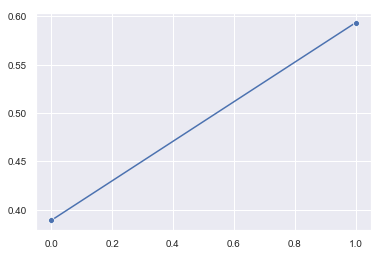

In [96]:
sns.lineplot(np.array(range(len(pca_df2.explained_variance_ratio_))), 
             np.cumsum(pca_df2.explained_variance_ratio_), marker='o')

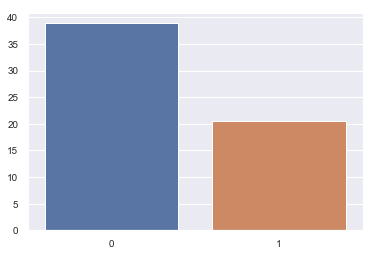

In [97]:
sns.barplot(x = np.array(range(len(pca_df2.explained_variance_ratio_))), 
            y=pca_df2.explained_variance_ratio_ * 100)

In [98]:
# Create a dataframe with the loadings, in order to plot them with the PCs
loadings_df2 = pd.DataFrame(data = pca_df2.components_
             , columns = df2.columns)

In [99]:
# Transpose the loadings
loadings_df2 = loadings_df2.T

In [100]:
loadings_df2

,0,1
FGA,0.250544,0.235298
FG%,0.254188,0.253496
3PA,-0.298252,0.255030
3P%,-0.289207,0.101234
2PA,0.355097,-0.106374
2P%,0.074809,0.442233
FTA,0.281078,-0.063958
FT%,-0.020112,0.207597
ORB,0.304248,-0.181152
DRB,-0.128010,0.420317


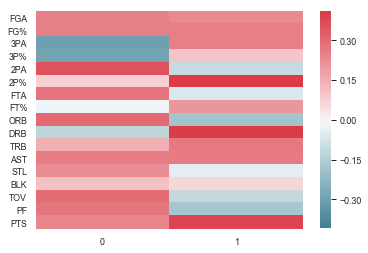

In [101]:
sns.set_context('paper')
cmap = sns.diverging_palette(220, 10, as_cmap=True)

sns.heatmap(loadings_df2, cmap=cmap, center=0, vmin=-0.41, vmax=0.41)

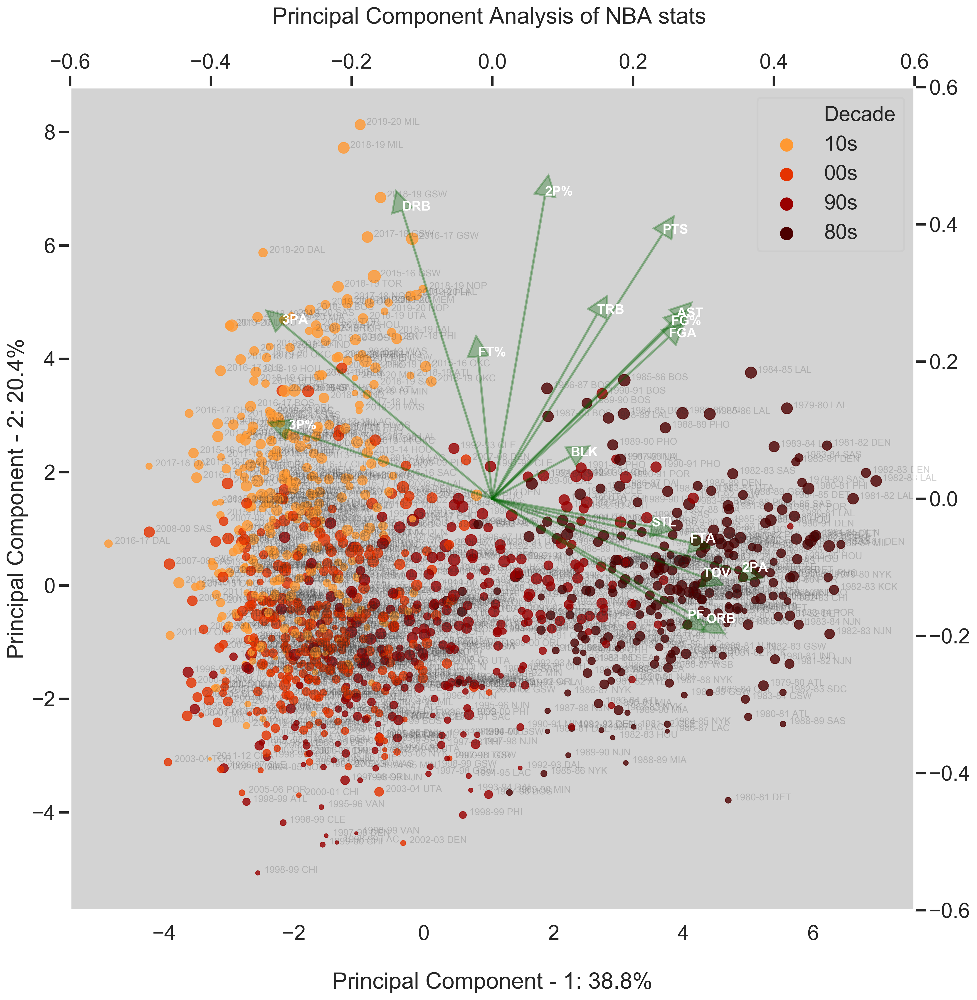

In [137]:
# Time for PCA

#Prepare the plot properties
sns.set_style('dark', {"axes.facecolor": "lightgrey"})
sns.set_context('poster')
mpl.rcParams['figure.dpi'] = 300

fig, ax = plt.subplots(figsize=(16, 16))

ax2 = ax.twinx().twiny()

# Create a Seaborn scatterplot
g = sns.scatterplot(data = principal_df2, x='principal component 1', y='principal component 2', 
                    alpha = 0.8, hue = 'Decade', s = pd.to_numeric(principal_df2['W'])**1.2, 
                    palette="gist_heat_r", edgecolor=None, ax = ax)
   

# Add annotations: Team names (df.index)
for i in range(0, len(principal_df2.index)):
   ax.annotate(principal_df2.index[i], (principal_df2.loc[:, 'principal component 1'][i] + 0.1, 
                       principal_df2.loc[:, 'principal component 2'][i]), fontsize=10, 
                alpha = 0.2) 
    
# Plot the loadings as arrows   
ax2.set_xlim(-0.6, 0.6)
ax2.set_ylim(-0.6, 0.6)

for j in range(0, len(loadings_df2.index)):
    ax2.arrow(0, 0, loadings_df2.iloc[:, 0][j], loadings_df2.iloc[:, 1][j],  head_width=0.03, 
              head_length=0.03, color='darkgreen', alpha = 0.3)
    
# Annotate the loadings
for z in range(0, len(loadings_df2.index)):
   ax2.annotate(loadings_df2.index[z], (loadings_df2.iloc[:, 0][z], loadings_df2.iloc[:, 1][z]),
                fontsize=14, color='white', weight='semibold') 

# Create x and y labels that show the PCA - explained variance percentages
ax.set_xlabel("\nPrincipal Component - 1: " + str(pca_df2.explained_variance_ratio_[0]*100)[0:4] + "%")
ax.set_ylabel("Principal Component - 2: " + str(pca_df2.explained_variance_ratio_[1]*100)[0:4] + "%")
plt.title("Principal Component Analysis of NBA stats \n")

plt.show()

# Bokeh

In [103]:
from bokeh.plotting import figure
from bokeh.io import output_file, show, curdoc, output_notebook, push_notebook
from bokeh.models import HoverTool, ColorBar, LinearColorMapper, LogColorMapper, ContinuousTicker, ColorMapper, ColorBar, Ticker, Button, ColumnDataSource, Slider, Arrow, OpenHead, CheckboxGroup, NormalHead, VeeHead, LabelSet, Label, Select
from bokeh.layouts import column, row, widgetbox
from ipywidgets import interact
from bokeh.transform import linear_cmap
from bokeh.themes import built_in_themes

output_notebook()

Loading BokehJS ...

In [104]:
# Convert the principal componenents Dataframe to numeric. 
principal_df2= pd.concat([principal_df2.iloc[:, :4], 
                               principal_df2.iloc[:, 4:].apply(pd.to_numeric)], axis=1)

In [105]:
principal_df2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1134 entries, 2019-20 MIL to 1988-89 CHH
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   principal component 1  1134 non-null   float64
 1   principal component 2  1134 non-null   float64
 2   Tm                     1134 non-null   object 
 3   Decade                 1134 non-null   object 
 4   Season                 1134 non-null   int64  
 5   W                      1134 non-null   int64  
 6   L                      1134 non-null   int64  
 7   Age                    1134 non-null   float64
 8   Height                 1134 non-null   float64
 9   Wt.                    1134 non-null   int64  
 10  G                      1134 non-null   int64  
 11  MP                     1134 non-null   float64
dtypes: float64(5), int64(5), object(2)
memory usage: 155.2+ KB


In [106]:
loadings_df2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17 entries, FGA to PTS
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       17 non-null     float64
 1   1       17 non-null     float64
dtypes: float64(2)
memory usage: 1.0+ KB


In [107]:
source = ColumnDataSource(data={'x': principal_df2['principal component 1'][principal_df2['Season'] == 1980], 
                                'y': principal_df2['principal component 2'][principal_df2['Season'] == 1980],
                               'teams' : principal_df2.index[principal_df2['Season'] == 1980],
                               'wins' : principal_df2['W'][principal_df2['Season'] == 1980]})

source2 = ColumnDataSource(data={'x': loadings_df2.iloc[:, 0]*17, 'y':loadings_df2.iloc[:, 1]*17, 
                           'loadings':loadings_df2.index})

# Hovertool
hover = HoverTool(tooltips=[("Team", "@teams")])

exp_cmap = LinearColorMapper(palette="Viridis256", low = 15, high = 65)

plot = figure(x_range=(-6, 9), y_range=(-6, 9), tools=[hover], title='PCA of NBA teams (1980 - 2019)', 
              x_axis_label='Principal Component 1 (43.5%)', y_axis_label='Principal Component 2 (19.7%)')

plot.xaxis.axis_label_text_font_size = "12pt"
plot.yaxis.axis_label_text_font_size = "12pt"

plot.circle(x= 'x', y='y', source=source, size=10, color='green', alpha=0.5, 
            fill_color={"field":"wins", "transform":exp_cmap})



for j in range(0, len(loadings_df2.index)):
    plot.add_layout(Arrow(end=NormalHead(size=8, fill_color="darkorange", line_width=0.5, 
                        line_color='orange', line_alpha = 0.3, fill_alpha = 0.3),
                          line_color='orange', line_alpha=0.3,  x_start=0, y_start=0, 
                          x_end=loadings_df2.iloc[:, 0][j]*17, y_end=loadings_df2.iloc[:, 1][j]*17))

for w in range(0, len(loadings_df2.index)):
    plot.add_layout(LabelSet(x='x', y='y', text='loadings', level='glyph', x_offset=1, 
                                      y_offset=1, source=source2, render_mode='canvas', 
                             text_color='white', text_font_size = '7pt'))


# Slider for years
slider = Slider(start=principal_df2['Season'].min(), end=principal_df2['Season'].max(), 
                value=principal_df2['Season'].min(), step=1, title='Season')

def callback(attr, old, new):
    season = slider.value
    source.data={'x': principal_df2['principal component 1'][principal_df2['Season'] <=  season], 
                'y' : principal_df2['principal component 2'][principal_df2['Season'] <= season],
                'teams' : principal_df2.index[principal_df2['Season'] <= season],
                'wins' : principal_df2['W'][principal_df2['Season'] <= season]}
slider.on_change('value', callback)

# Drop menu for teams
menu = Select(options= principal_df2['Tm'].unique().tolist(),
value='None', title='Teams')

def callback(attr, old, new):
    team = menu.value
    source.data={'x': principal_df2['principal component 1'][principal_df2['Tm'] == team], 
                'y' : principal_df2['principal component 2'][principal_df2['Tm'] == team],
                'teams' : principal_df2.index[principal_df2['Tm'] == team],
                'wins' : principal_df2['W'][principal_df2['Tm'] == team]}
menu.on_change('value', callback)

# Drop menu for seasons
season_list = []
for i in principal_df2['Season'].unique():
    season_list.append(str(i))

menu2 = Select(options= sorted(season_list),
value='1980', title='Season')

def callback(attr, old, new):
    season2 = menu2.value
    source.data={'x': principal_df2['principal component 1'][principal_df2['Season'] == int(season2)], 
                'y' : principal_df2['principal component 2'][principal_df2['Season'] == int(season2)],
                'teams' : principal_df2.index[principal_df2['Season'] == int(season2)],
                'wins' : principal_df2['W'][principal_df2['Season'] == int(season2)]}
menu2.on_change('value', callback)

                                
bar = ColorBar(color_mapper=exp_cmap, label_standoff=8, location=(0,0), title='Wins')
plot.add_layout(bar, "right")

plot.background_fill_color = "grey"
plot.background_fill_alpha = 0.3

curdoc().theme = 'caliber'

# Arrange plots and widgets in layouts
layout = column(row(menu, menu2), plot, slider)

curdoc().add_root(layout)

In [108]:
show(layout)

You are generating standalone HTML/JS output, but trying to use real Python
callbacks (i.e. with on_change or on_event). This combination cannot work.

Only JavaScript callbacks may be used with standalone output. For more
information on JavaScript callbacks with Bokeh, see:

    http://bokeh.pydata.org/en/latest/docs/user_guide/interaction/callbacks.html

Alternatively, to use real Python callbacks, a Bokeh server application may
be used. For more information on building and running Bokeh applications, see:

    http://bokeh.pydata.org/en/latest/docs/user_guide/server.html



In [159]:
principal_df2

,principal component 1,principal component 2,Tm,Decade,Season,W,L,Age,Height,Wt.,G,MP
Team,,,,,,,,,,,,
2019-20 MIL,-1.536634,8.624282,MIL,10s,2019,53,12,29.2,198.12,226,65,240.8
2018-19 MIL,-1.700184,8.223865,MIL,10s,2018,60,22,26.9,200.66,227,82,241.2
2017-18 MIL,-1.875808,2.547013,MIL,10s,2017,44,38,25.9,200.66,218,82,241.8
2016-17 MIL,-2.504494,2.128424,MIL,10s,2016,42,40,25.6,200.66,223,82,241.2
2015-16 MIL,-1.243704,0.405157,MIL,10s,2015,33,49,23.5,203.20,228,82,241.8
...,...,...,...,...,...,...,...,...,...,...,...,...
1992-93 CHH,3.357227,1.274050,CHH,90s,1992,44,38,25.7,193.04,203,82,240.9
1991-92 CHH,3.934520,0.555568,CHH,90s,1991,31,51,25.2,193.04,204,82,241.5
1990-91 CHH,2.117508,-1.541037,CHH,90s,1990,26,56,25.5,195.58,206,82,241.5
